In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()

In [2]:
depressed_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/depressed.csv',  sep='\t')
depressed_tweets_df.head()


,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1372013657807290369,1372013657807290369,2021-03-17 08:05:21 Sri Lanka Standard Time,2021-03-17,08:05:21,530,955836289709944832,msbryantimages,Britt Bryant,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1372013653914906625,1372010501492850696,2021-03-17 08:05:20 Sri Lanka Standard Time,2021-03-17,08:05:20,530,74573639,sharksandswain,Sarah 🦈🎶,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'subtextiel', 'name': 'Dmitri...",NaN,NaN,NaN,NaN
2,1372013644083519489,1372013644083519489,2021-03-17 08:05:18 Sri Lanka Standard Time,2021-03-17,08:05:18,530,1336398104866795522,shadic_627,Shadic627,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1372013626303778818,1372013626303778818,2021-03-17 08:05:13 Sri Lanka Standard Time,2021-03-17,08:05:13,530,1328090774081130496,evilmilkis,Cactass,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1372013588399939584,1371990105091678211,2021-03-17 08:05:04 Sri Lanka Standard Time,2021-03-17,08:05:04,530,1157231227293900800,empressmish13,🌸ₘ.ₐ. ₗₐₚᵢₙₛₖᵢ🌸,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Jim_Jordan', 'name': 'Rep. J...",NaN,NaN,NaN,NaN


In [3]:
depression_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/depression.csv',  sep='\t')
anxiety_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/anxiety.csv',  sep='\t')
overwhelmed_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/overwhelmed.csv',  sep='\t')
exhausted_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/exhausted.csv',  sep='\t')
anxious_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/anxious.csv',  sep='\t')
tired_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/tired.csv',  sep='\t')
discouraged_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/discouraged.csv',  sep='\t')
demotivated_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/demotivated.csv',  sep='\t')
worried_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/worried.csv',  sep='\t')
lonely_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/lonely.csv',  sep='\t')
sad_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/sad.csv',  sep='\t')
hopeless_tweets_df = pd.read_csv('E:/Project 5 credits/Final Project/depressive tweets before/hopeless.csv',  sep='\t')

df_depressive_reindex = pd.concat([depressed_tweets_df,depression_tweets_df,anxiety_tweets_df,overwhelmed_tweets_df,
                            exhausted_tweets_df,anxious_tweets_df,tired_tweets_df,discouraged_tweets_df,demotivated_tweets_df,
                           worried_tweets_df,lonely_tweets_df, sad_tweets_df, hopeless_tweets_df], ignore_index=True)

df_depressive_reindex

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3166: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,conversation_id,created_at,date,time,timezone,user_id,username,name,place,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1372013657807290369,1372013657807290369,2021-03-17 08:05:21 Sri Lanka Standard Time,2021-03-17,08:05:21,530,955836289709944832,msbryantimages,Britt Bryant,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
1,1372013653914906625,1372010501492850696,2021-03-17 08:05:20 Sri Lanka Standard Time,2021-03-17,08:05:20,530,74573639,sharksandswain,Sarah 🦈🎶,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'subtextiel', 'name': 'Dmitri...",NaN,NaN,NaN,NaN
2,1372013644083519489,1372013644083519489,2021-03-17 08:05:18 Sri Lanka Standard Time,2021-03-17,08:05:18,530,1336398104866795522,shadic_627,Shadic627,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
3,1372013626303778818,1372013626303778818,2021-03-17 08:05:13 Sri Lanka Standard Time,2021-03-17,08:05:13,530,1328090774081130496,evilmilkis,Cactass,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
4,1372013588399939584,1371990105091678211,2021-03-17 08:05:04 Sri Lanka Standard Time,2021-03-17,08:05:04,530,1157231227293900800,empressmish13,🌸ₘ.ₐ. ₗₐₚᵢₙₛₖᵢ🌸,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'Jim_Jordan', 'name': 'Rep. J...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251025,1371519987110744064,1371519984078266368,2021-03-15 23:23:41 Sri Lanka Standard Time,2021-03-15,23:23:41,530,1301659140654133248,131everyday,Feb | HANBIN ON MARCH 19 🌃🌅,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
251026,1371519939757105165,1371519939757105165,2021-03-15 23:23:29 Sri Lanka Standard Time,2021-03-15,23:23:29,530,1346283931600121859,forhanker,hopeless romantic 💞🥰,NaN,...,NaN,NaN,NaN,NaN,NaN,[],NaN,NaN,NaN,NaN
251027,1371519939388002310,1371518972206661632,2021-03-15 23:23:29 Sri Lanka Standard Time,2021-03-15,23:23:29,530,1361394059315613696,writebernadette,Bernadette Crane,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'kfoxx_writes', 'name': 'Kath...",NaN,NaN,NaN,NaN
251028,1371519895104589824,1371518299209613316,2021-03-15 23:23:19 Sri Lanka Standard Time,2021-03-15,23:23:19,530,978421200149008384,caramalkallypso,kala ⟭⟬⁷ || 🍊,NaN,...,NaN,NaN,NaN,NaN,NaN,"[{'screen_name': 'EgosShadow7', 'name': 'Nicol...",NaN,NaN,NaN,NaN


In [4]:
df_depressive_reindex.info(null_counts=True)

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251030 entries, 0 to 251029
Data columns (total 36 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               251030 non-null  int64  
 1   conversation_id  251030 non-null  int64  
 2   created_at       251030 non-null  object 
 3   date             251030 non-null  object 
 4   time             251030 non-null  object 
 5   timezone         251030 non-null  int64  
 6   user_id          251030 non-null  int64  
 7   username         251030 non-null  object 
 8   name             251018 non-null  object 
 9   place            41 non-null      object 
 10  tweet            251030 non-null  object 
 11  language         251030 non-null  object 
 12  mentions         251030 non-null  object 
 13  urls             251030 non-null  object 
 14  photos           251030 non-null  object 
 15  replies_count    251030 non-null  int64  
 16  retweets_count   251030 non-null  int6

In [5]:
df_depressive_reindex.dtypes

id                   int64
conversation_id      int64
created_at          object
date                object
time                object
timezone             int64
user_id              int64
username            object
name                object
place               object
tweet               object
language            object
mentions            object
urls                object
photos              object
replies_count        int64
retweets_count       int64
likes_count          int64
hashtags            object
cashtags            object
link                object
retweet               bool
quote_url           object
video                int64
thumbnail           object
near               float64
geo                float64
source             float64
user_rt_id         float64
user_rt            float64
retweet_id         float64
reply_to            object
retweet_date       float64
translate          float64
trans_src          float64
trans_dest         float64
dtype: object

<AxesSubplot:>

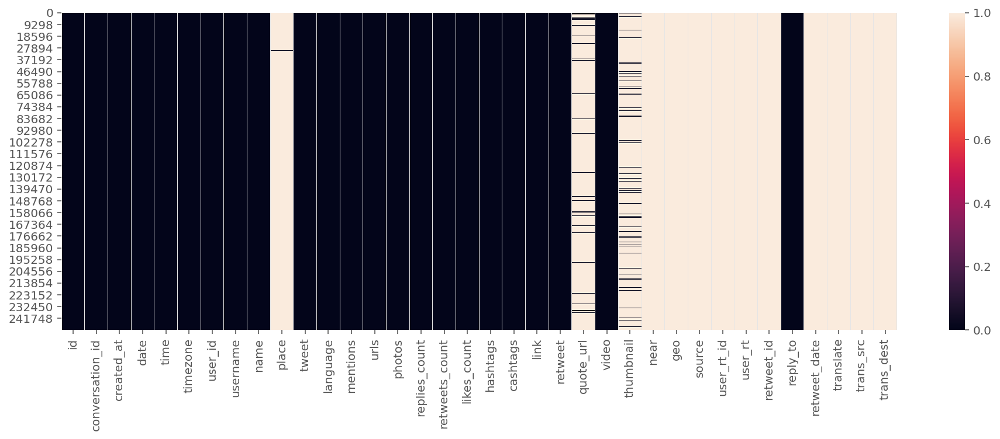

In [6]:
# check for null value in data
plt.figure(figsize = (16,5))
sns.heatmap(df_depressive_reindex.isnull())

In [7]:
df_depressive_reindex.corr()

,id,conversation_id,timezone,user_id,replies_count,retweets_count,likes_count,retweet,video,near,geo,source,user_rt_id,user_rt,retweet_id,retweet_date,translate,trans_src,trans_dest
id,1.000000,0.014120,NaN,-0.000153,-0.018102,-0.013032,-0.012207,NaN,-0.023875,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conversation_id,0.014120,1.000000,NaN,-0.004626,0.000568,0.000637,0.000711,NaN,-0.000568,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
timezone,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
user_id,-0.000153,-0.004626,NaN,1.000000,-0.008893,-0.007163,-0.010546,NaN,0.009937,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
replies_count,-0.018102,0.000568,NaN,-0.008893,1.000000,0.469777,0.463423,NaN,0.020730,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweets_count,-0.013032,0.000637,NaN,-0.007163,0.469777,1.000000,0.868256,NaN,0.013249,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
likes_count,-0.012207,0.000711,NaN,-0.010546,0.463423,0.868256,1.000000,NaN,0.011806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retweet,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
video,-0.023875,-0.000568,NaN,0.009937,0.020730,0.013249,0.011806,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
near,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Text(0.5, 1.0, 'Correlation Heatmap')

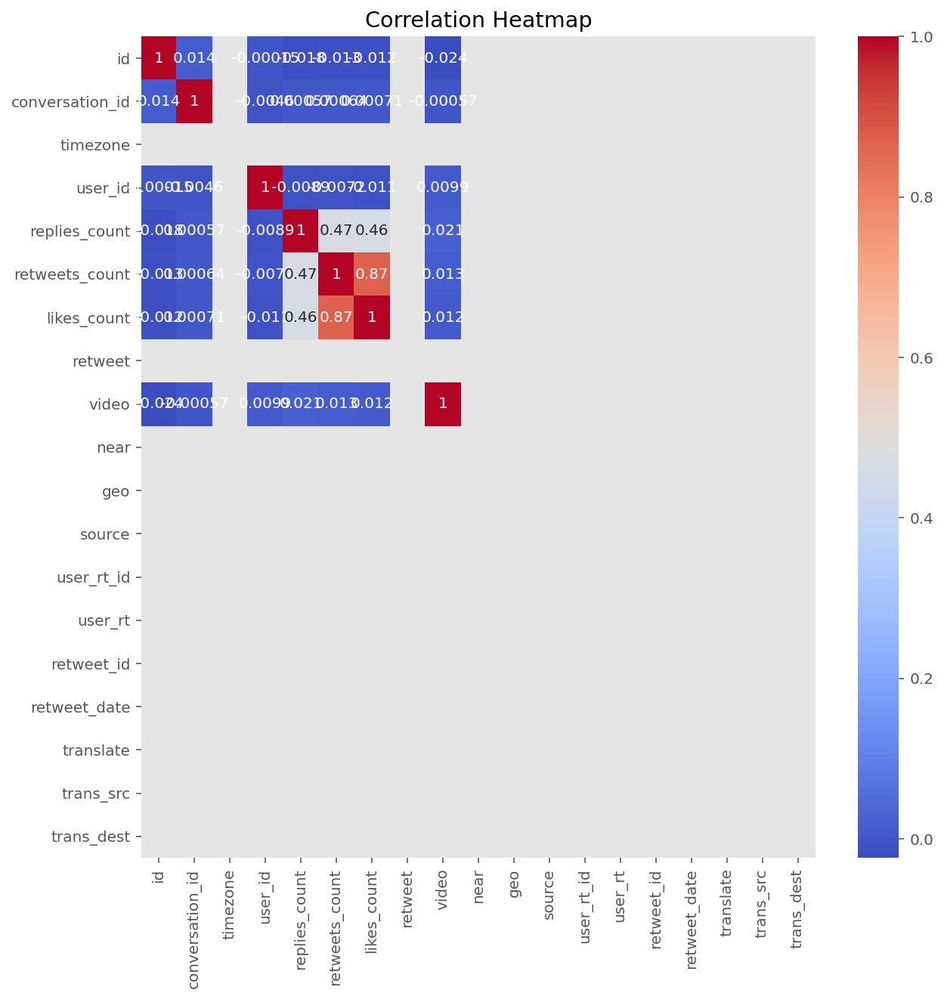

In [8]:
plt.figure(figsize=(10,10))
sns.heatmap(df_depressive_reindex.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap')

In [9]:
df_depressive_reindex.drop(['hashtags','cashtags','thumbnail','source','user_rt','retweet_id','reply_to','retweet_date','translate','trans_src','trans_dest', 'timezone', 'name', 'created_at', 'user_id', 'place', 'likes_count', 'link', 'retweet', 'quote_url', 'video', 'user_rt_id', 'near', 'geo', 'mentions', 'urls', 'photos', 'replies_count', 'retweets_count','conversation_id'], axis = 1, inplace = True)
df_depressive_reindex.drop_duplicates()
df_depressive_reindex.head()

,id,date,time,username,tweet,language
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en
2,1372013644083519489,2021-03-17,08:05:18,shadic_627,"Ghoste Menschen, die mir viel bedeuten, sobald...",de
3,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en
4,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en


In [10]:
df_depressive_reindex.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 251030 entries, 0 to 251029
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        251030 non-null  int64 
 1   date      251030 non-null  object
 2   time      251030 non-null  object
 3   username  251030 non-null  object
 4   tweet     251030 non-null  object
 5   language  251030 non-null  object
dtypes: int64(1), object(5)
memory usage: 11.5+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


In [11]:
df_depressive_reindex.dtypes

id           int64
date        object
time        object
username    object
tweet       object
language    object
dtype: object

<AxesSubplot:>

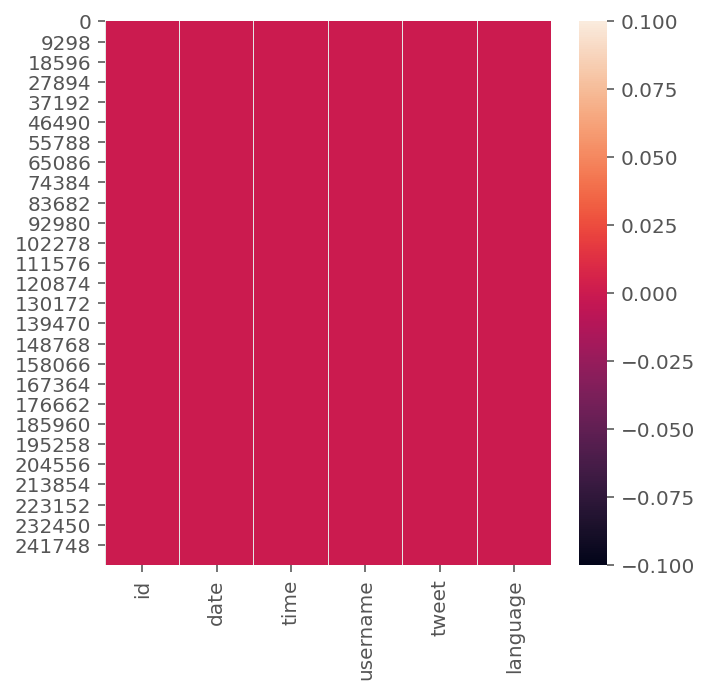

In [12]:
# check for null value in data
plt.figure(figsize = (5,5))
sns.heatmap(df_depressive_reindex.isnull())

Text(0.5, 1.0, 'Correlation Heatmap After Dropping Null Val')

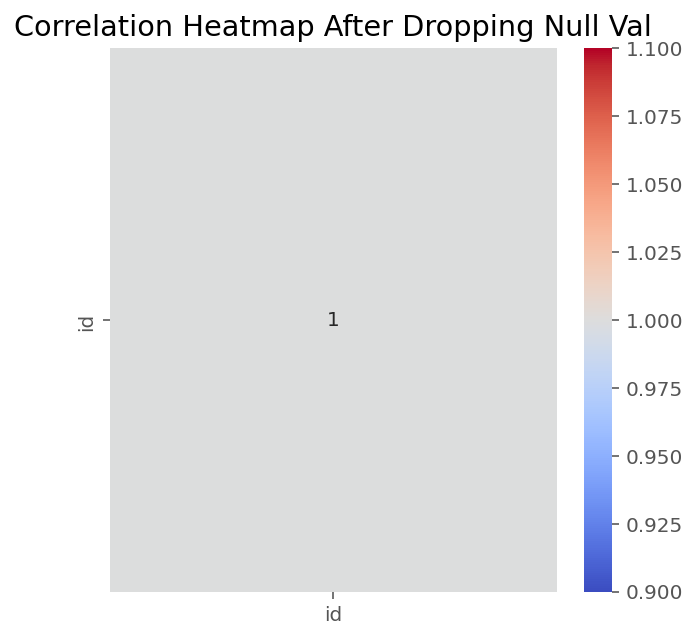

In [13]:
plt.figure(figsize=(5,5))
sns.heatmap(df_depressive_reindex.corr(), annot=True, cmap="coolwarm").set_title('Correlation Heatmap After Dropping Null Val')

In [14]:
df_english_only = df_depressive_reindex[df_depressive_reindex['language'] == 'en']
df_english_only.head()

,id,date,time,username,tweet,language
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en
3,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en
4,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en
5,1372013584499290118,2021-03-17,08:05:03,andiepabon,I mean Matt's depression beard says it all. #A...,en


In [15]:
df_english_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222038 entries, 0 to 251029
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        222038 non-null  int64 
 1   date      222038 non-null  object
 2   time      222038 non-null  object
 3   username  222038 non-null  object
 4   tweet     222038 non-null  object
 5   language  222038 non-null  object
dtypes: int64(1), object(5)
memory usage: 11.9+ MB


c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: null_counts is deprecated. Use show_counts instead
  """Entry point for launching an IPython kernel.


In [16]:
df_depressive_reindex = pd.concat([df_english_only], ignore_index=True)

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
df_new = df_depressive_reindex[df_depressive_reindex['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                         id        date      time         username  \
0       1372013657807290369  2021-03-17  08:05:21   msbryantimages   
1       1372013653914906625  2021-03-17  08:05:20   sharksandswain   
2       1372013626303778818  2021-03-17  08:05:13       evilmilkis   
3       1372013588399939584  2021-03-17  08:05:04    empressmish13   
4       1372013584499290118  2021-03-17  08:05:03       andiepabon   
...                     ...         ...       ...              ...   
222033  1371520019708981249  2021-03-15  23:23:48    hopelessblade   
222034  1371519987110744064  2021-03-15  23:23:41      131everyday   
222035  1371519939388002310  2021-03-15  23:23:29  writebernadette   
222036  1371519895104589824  2021-03-15  23:23:19  caramalkallypso   
222037  1371519888221634561  2021-03-15  23:23:17  ch4mpagnemamiii   

                                                    tweet language  \
0       Depression will have u cryin random nite and u...       en   
1       @subtextiel

In [19]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))


#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()
scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [20]:
df_new.head()

,id,date,time,username,tweet,language,text,sentiment
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en,depression u cryin random nite u dont even know,Negative
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en,subtextiel a test put crushing weight successf...,Negative
2,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en,starts feeling suicidal depression getting wor...,Negative
3,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en,jim_jordan remember gop tax cuts supposed tric...,Negative
4,1372013584499290118,2021-03-17,08:05:03,andiepabon,I mean Matt's depression beard says it all. #A...,en,i mean matts depression beard says all afterth...,Negative


(-0.5, 399.5, 199.5, -0.5)

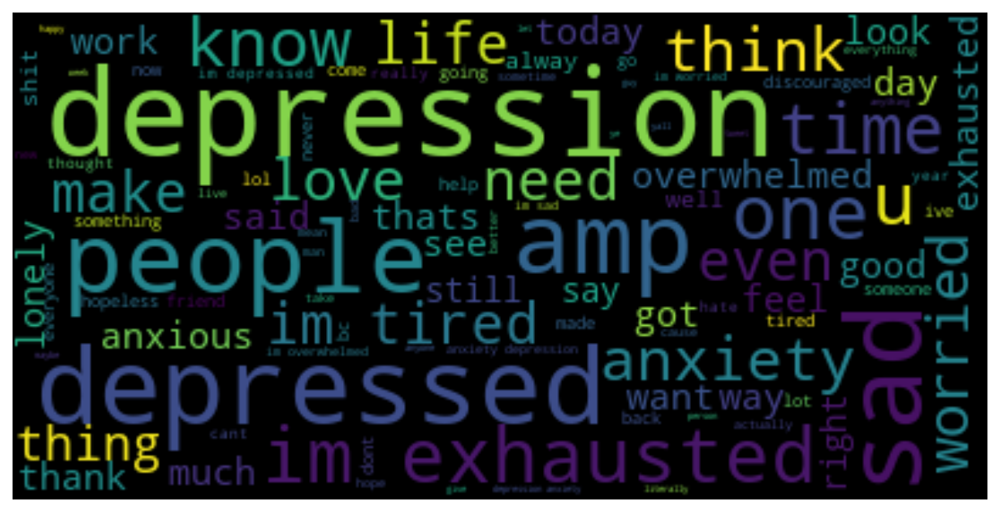

In [21]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [22]:
df_new['text']

0           depression u cryin random nite u dont even know
1         subtextiel a test put crushing weight successf...
2         starts feeling suicidal depression getting wor...
3         jim_jordan remember gop tax cuts supposed tric...
4         i mean matts depression beard says all afterth...
                                ...                        
222033                              he looks like pennywise
222034    after happened lost source happiness i cried e...
222035    kfoxx_writes i always start dream casting mc s...
222036    egosshadow i couldnt focus tbh its like people...
222037    im probably gonna cry tha shit future man ctfu...
Name: text, Length: 222038, dtype: object

In [23]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
0,Negative,142187
2,Positive,66972
1,Neutral,12879


<AxesSubplot:xlabel='sentiment', ylabel='count'>

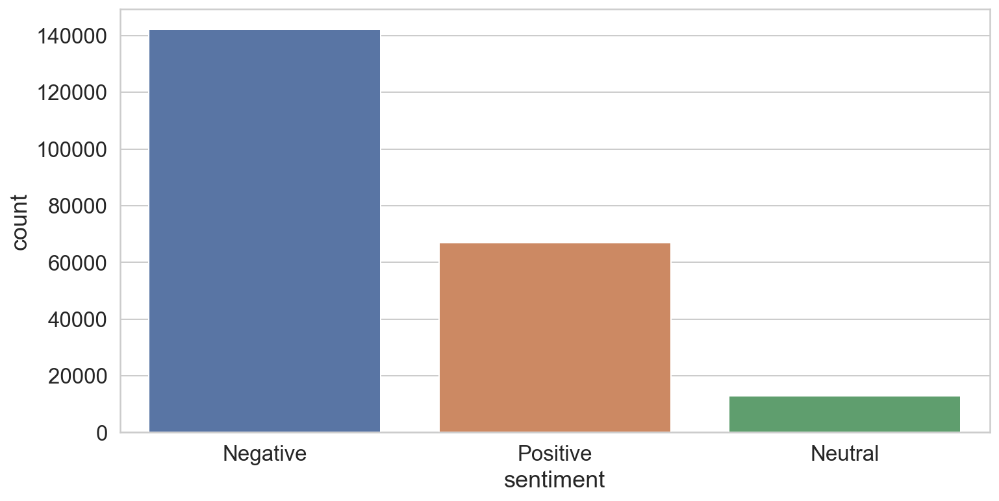

In [24]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [25]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

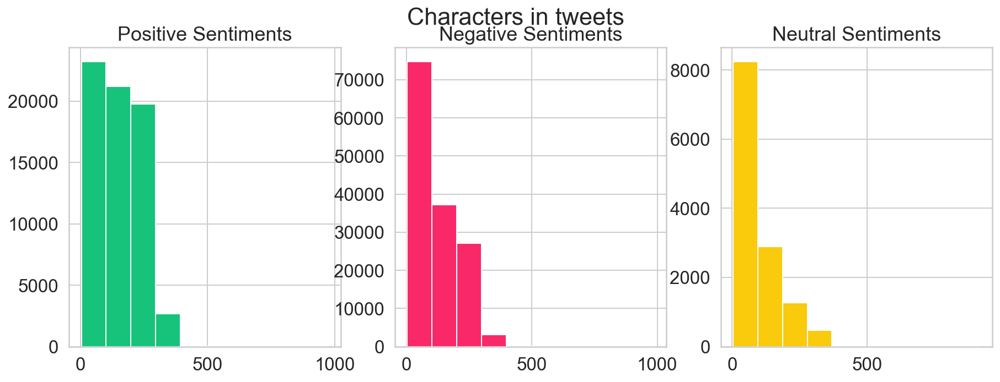

In [26]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

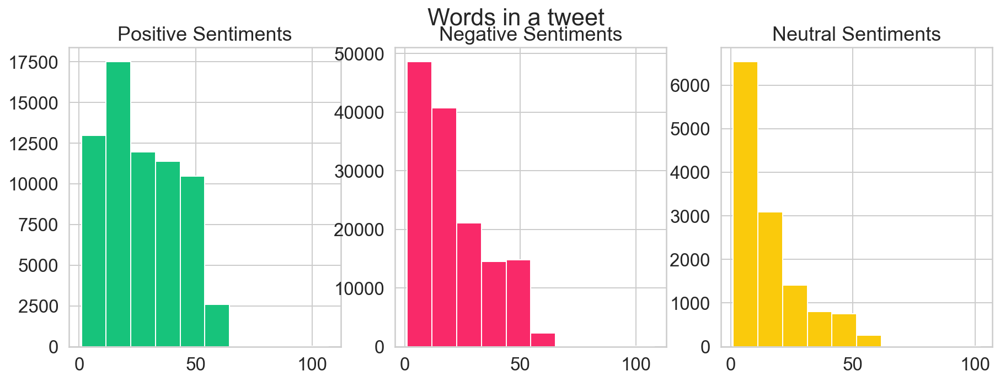

In [27]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()


Text(0.5, 0.98, 'Average word length in each tweet')

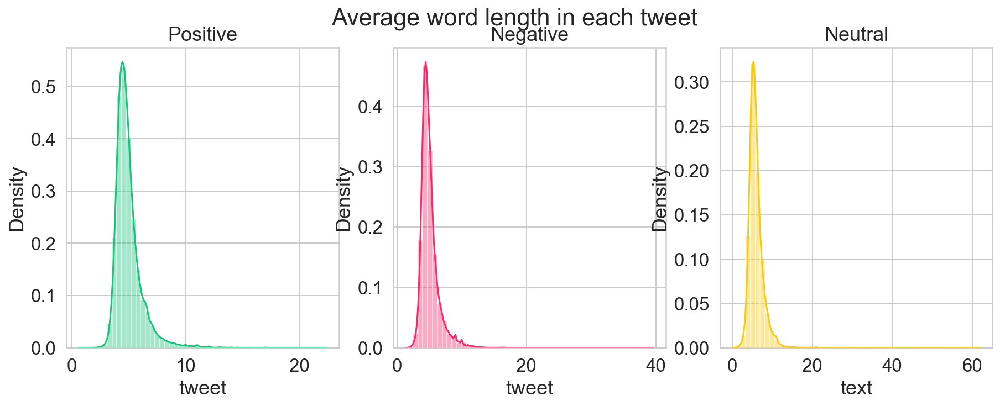

In [28]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [29]:
def create_corpus(target):
    corpus=[]
    
    for x in df_new[df_new['sentiment']==target ]['text'].str.split():
        for i in x:
            corpus.append(i)
    return corpus


In [30]:
np.array(stopwords)

array({'haven', 'hadn', 'can', 'theirs', "shouldn't", 'below', 'that', 'shouldn', 'an', 'doing', 'mustn', 'most', 'himself', 'very', 'shan', "wouldn't", "you'll", 'has', 'won', "mustn't", 'didn', 'herself', 'once', 'of', "shan't", 'she', "you're", "you'd", 'ourselves', 'on', 'with', "isn't", 'will', 'other', 'had', 'couldn', "you've", 'more', 'why', 'hers', 'i', 'to', 'y', 'both', 'doesn', 'it', 'just', "that'll", 'from', "should've", 'those', 'are', 've', 'was', 'if', 'have', 'did', 'while', 'off', 'own', 'same', 'll', 'her', 'we', "she's", 'them', 'o', "hasn't", 'our', 't', 'ma', "won't", 'no', 'being', 'where', "wasn't", 'don', "hadn't", 'only', "haven't", 'they', 'which', 'and', 'so', 'as', 'between', 'into', 'than', 're', 'then', 'themselves', 'been', 'whom', 'because', 'after', 'through', 'up', 'under', 'some', 'ours', 'were', 'until', 'do', 'yours', 'my', 'how', 'above', 'these', 'aren', 'wouldn', 'their', 'by', 'down', 'myself', 'all', "needn't", 'weren', 'each', 'mightn', 'he'

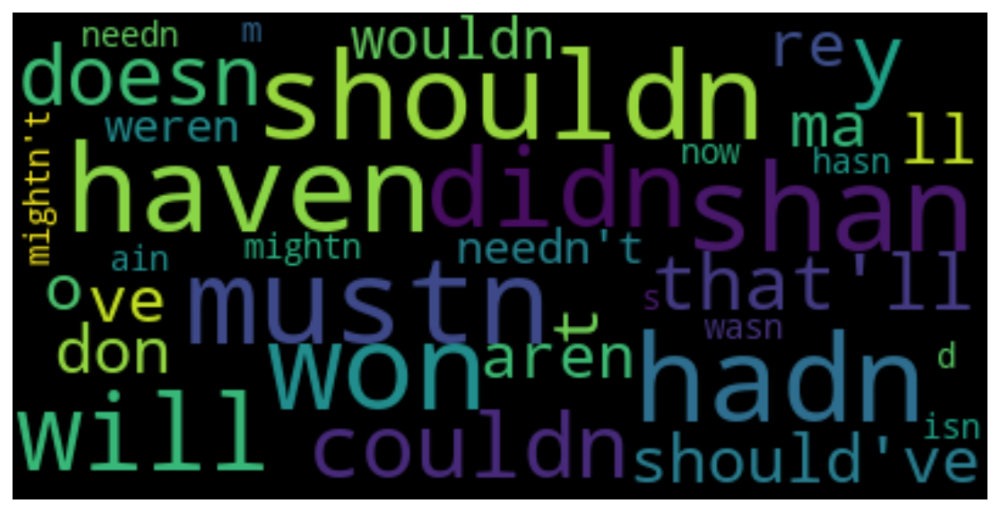

In [31]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 


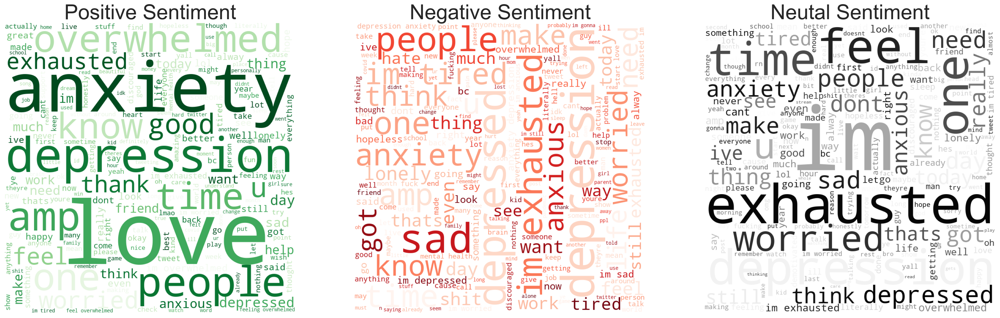

In [32]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [33]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

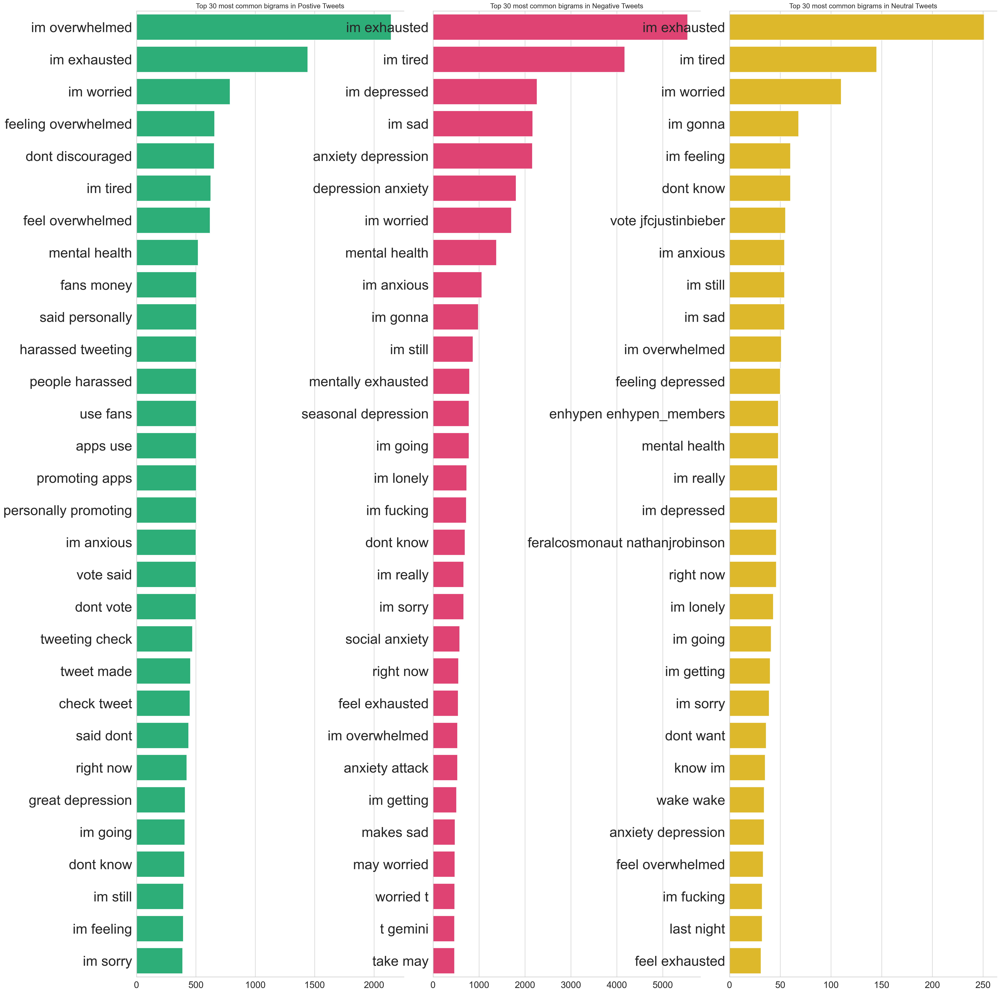

In [34]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

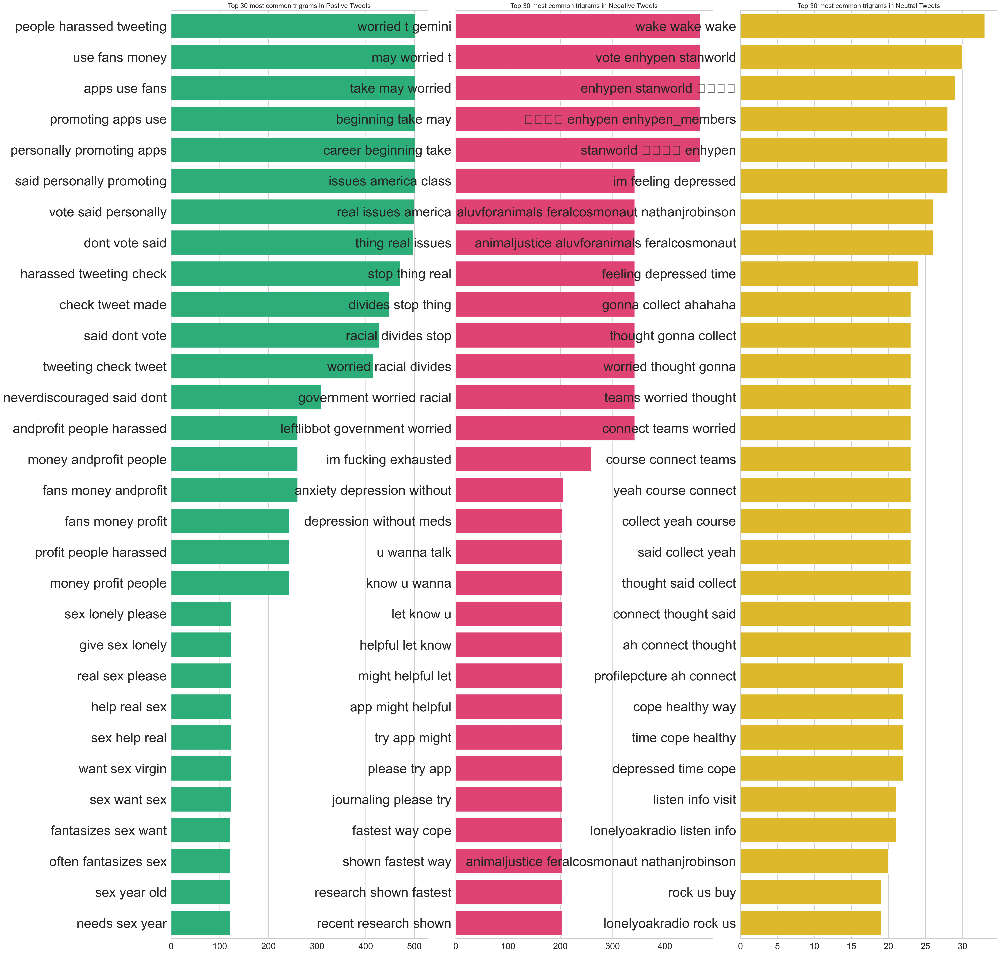

In [35]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [36]:
df_new.head()

,id,date,time,username,tweet,language,text,sentiment
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en,depression u cryin random nite u dont even know,Negative
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en,subtextiel a test put crushing weight successf...,Negative
2,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en,starts feeling suicidal depression getting wor...,Negative
3,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en,jim_jordan remember gop tax cuts supposed tric...,Negative
4,1372013584499290118,2021-03-17,08:05:03,andiepabon,I mean Matt's depression beard says it all. #A...,en,i mean matts depression beard says all afterth...,Negative


In [37]:
df_negative_only = df_new[df_new['sentiment'] == 'Negative']
df_negative_only.head()

,id,date,time,username,tweet,language,text,sentiment
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en,depression u cryin random nite u dont even know,Negative
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en,subtextiel a test put crushing weight successf...,Negative
2,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en,starts feeling suicidal depression getting wor...,Negative
3,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en,jim_jordan remember gop tax cuts supposed tric...,Negative
4,1372013584499290118,2021-03-17,08:05:03,andiepabon,I mean Matt's depression beard says it all. #A...,en,i mean matts depression beard says all afterth...,Negative


In [38]:
df_negative_only['label'] = df_negative_only['sentiment'].replace("Negative",0)
df_negative_only = pd.concat([df_negative_only], ignore_index=True)

In [39]:
df_negative_only.head()

,id,date,time,username,tweet,language,text,sentiment,label
0,1372013657807290369,2021-03-17,08:05:21,msbryantimages,Depression will have u cryin random nite and u...,en,depression u cryin random nite u dont even know,Negative,0
1,1372013653914906625,2021-03-17,08:05:20,sharksandswain,@subtextiel an A on a test or put such a crush...,en,subtextiel a test put crushing weight successf...,Negative,0
2,1372013626303778818,2021-03-17,08:05:13,evilmilkis,"*starts feeling suicidal, depression getting w...",en,starts feeling suicidal depression getting wor...,Negative,0
3,1372013588399939584,2021-03-17,08:05:04,empressmish13,@Jim_Jordan Remember those GOP tax cuts that w...,en,jim_jordan remember gop tax cuts supposed tric...,Negative,0
4,1372013584499290118,2021-03-17,08:05:03,andiepabon,I mean Matt's depression beard says it all. #A...,en,i mean matts depression beard says all afterth...,Negative,0


In [40]:
df_negative_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142187 entries, 0 to 142186
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   id         142187 non-null  int64 
 1   date       142187 non-null  object
 2   time       142187 non-null  object
 3   username   142187 non-null  object
 4   tweet      142187 non-null  object
 5   language   142187 non-null  object
 6   text       142187 non-null  object
 7   sentiment  142187 non-null  object
 8   label      142187 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 9.8+ MB


In [41]:
df_negative_only = df_negative_only.drop_duplicates()
len(df_negative_only)

138824

In [42]:
#As words are in the order of csv files we imported , we have to shuffle the rows
df_negative_only = df_negative_only.sample(frac=1).reset_index(drop=True)
df_negative_only.head()

,id,date,time,username,tweet,language,text,sentiment,label
0,1371934480148148226,2021-03-17,02:50:44,phasha_cm,@koko_matshela @RonaldLamola @DOJCD_ZA Black w...,en,koko_matshela ronaldlamola dojcd_za black wome...,Negative,0
1,1371681702016393218,2021-03-16,10:06:17,lacroicsz,I am a bit older but I am so depressed about w...,en,i bit older i depressed going gender i never t...,Negative,0
2,1371976194976022531,2021-03-17,05:36:29,spritermarduk,"@Natasha_Nrukami ""Oh no...."" Soul says worried...",en,natasha_nrukami oh no soul says worried if hun...,Negative,0
3,1371920625636376580,2021-03-17,01:55:40,foolsgoodbye,"@CH3RRYSMOON AM OK, LONELY THO SMDBDB HBU?",en,chrrysmoon am ok lonely tho smdbdb hbu,Negative,0
4,1371576124665430016,2021-03-16,03:06:45,faria_tuhi,@PJHaubrock Do not know about the trend but it...,en,pjhaubrock do know trend forces us go stress d...,Negative,0


In [43]:
df_negative_only.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 138824 entries, 0 to 138823
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   id         138824 non-null  int64 
 1   date       138824 non-null  object
 2   time       138824 non-null  object
 3   username   138824 non-null  object
 4   tweet      138824 non-null  object
 5   language   138824 non-null  object
 6   text       138824 non-null  object
 7   sentiment  138824 non-null  object
 8   label      138824 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 9.5+ MB


In [44]:
del df_negative_only["sentiment"]
del df_negative_only["text"]

In [45]:
df_neg = pd.concat([df_negative_only.iloc[0:100000]])
len(df_neg)

100000

In [46]:
export_csv = df_neg.to_csv(r'labeled depressive tweets.csv')